In [10]:
import numpy as np
import pandas as pd
import scanpy as sc
from collections import Counter
import matplotlib
#matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import scanpy.external as sce
import bbknn
sc.set_figure_params(dpi_save=300)


/home/liusong/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


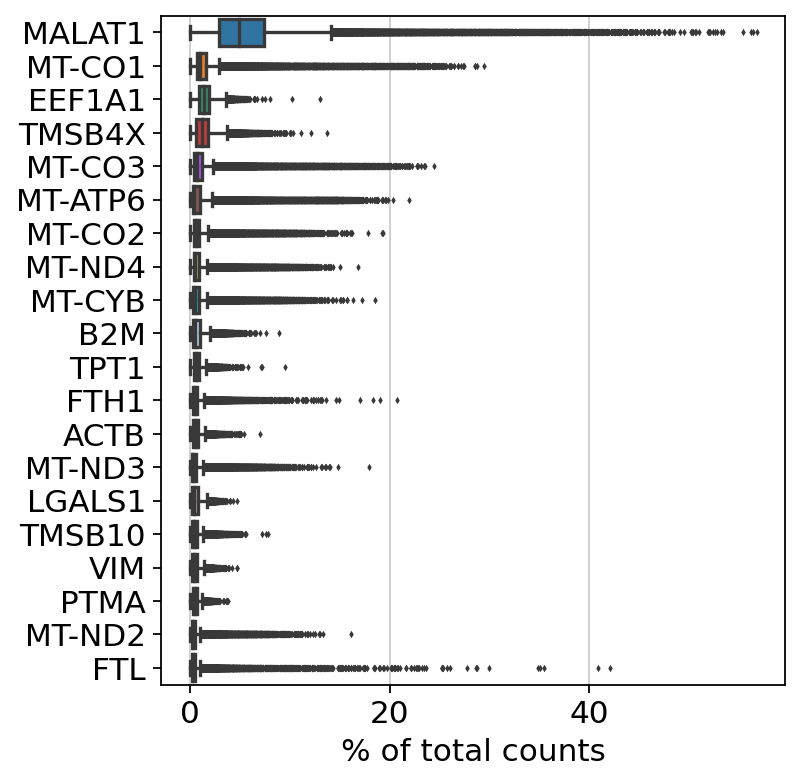

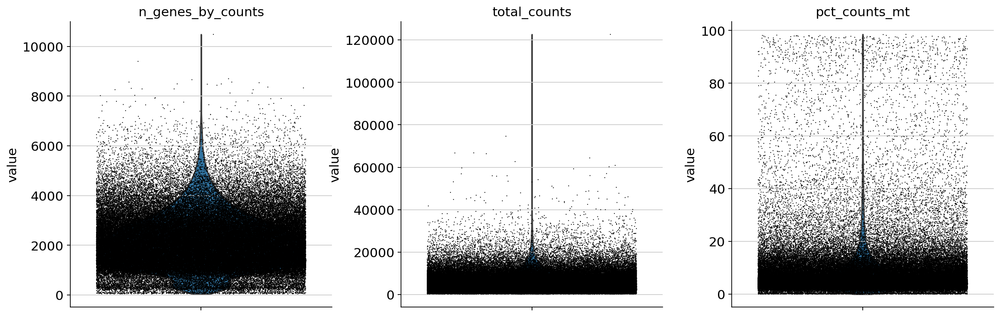

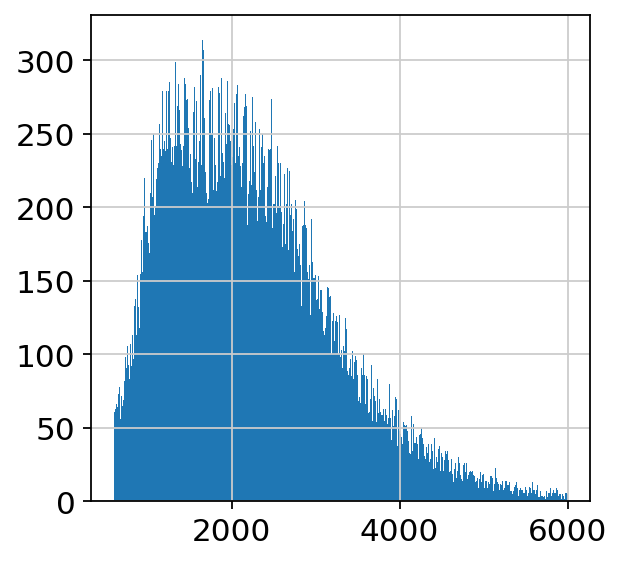

In [11]:
alldata=sc.read_10x_h5("/home/liusong/scRNA/endometriosis/V2data/aggregating/21samples/outs/count/filtered_feature_bc_matrix.h5",genome=None,gex_only=True)
#adata=sc.read_h5ad("/home/liusong/scRNA/endometriosis/V2data/scanpy/21samples/adata_umap_leiden_BBKNN.h5ad")

alldata.var_names_make_unique()
alldata
#CCgene=alldata.var_names.isin(CCgenes)  #remove Cell Cycle genes
#alldata=alldata[:,~CCgene]
ribosomes=alldata.var_names.str.match("^RP[LS]")
alldata=alldata[:,~ribosomes] #remove ribosome genes


sc.pl.highest_expr_genes(alldata,n_top=20,save="alldata_highest_top20_expr_genes.png")
alldata
alldata.var['mt']=alldata.var_names.str.startswith('MT-')
#alldata.var['rb']=alldata.var_names.str.match("^RP[LS]")
sc.pp.calculate_qc_metrics(alldata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(alldata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],jitter=0.4, multi_panel=True)
plt.hist(alldata.obs['n_genes_by_counts'],bins=1000,range=(600,6000))
plt.show()


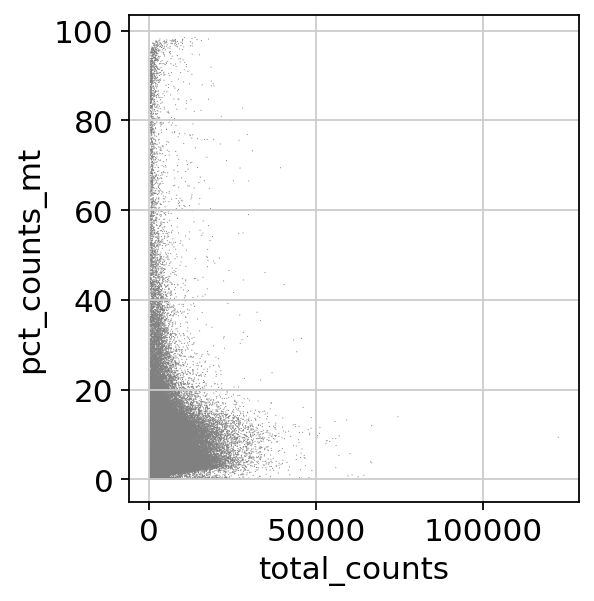

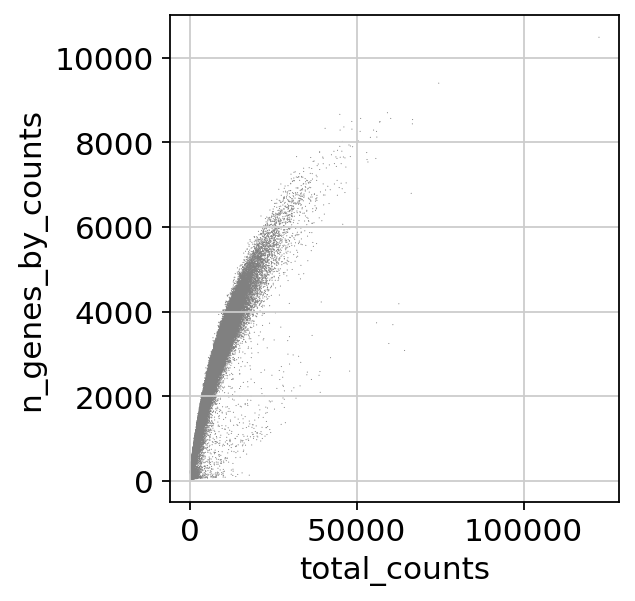

/home/liusong/.local/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:140: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['n_genes'] = number


In [12]:
sc.pl.scatter(alldata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(alldata, x='total_counts', y='n_genes_by_counts')
sc.pp.filter_genes(alldata,min_cells=10)
alldata = alldata[alldata.obs.n_genes_by_counts < 6000, :]
alldata = alldata[alldata.obs.total_counts < 25000, :]
alldata = alldata[alldata.obs.pct_counts_mt < 20, :]
sc.pp.filter_cells(alldata,min_genes=600)
sc.pp.normalize_total(alldata, target_sum=1e4)
sc.pp.log1p(alldata)
alldata.obs['sampleID']=alldata.obs_names.str.lstrip('ATCG-')
#sc.tl.score_genes_cell_cycle(alldata, Sgenes, G2genes)
alldata.write("alldata_normalized2024.h5ad")


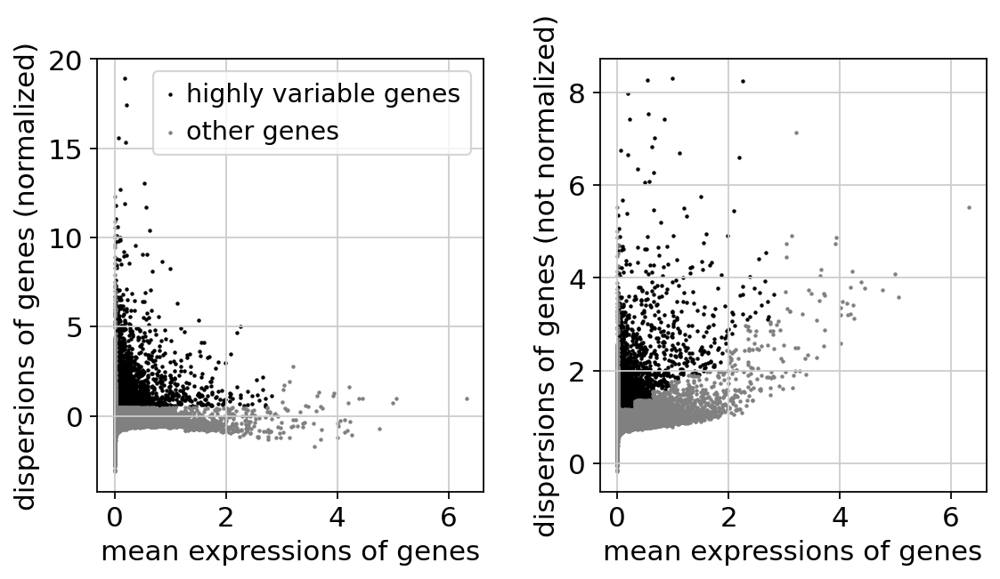

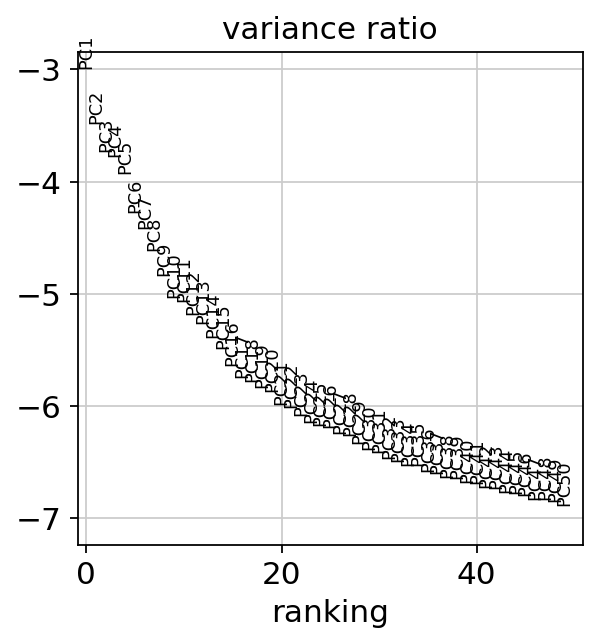

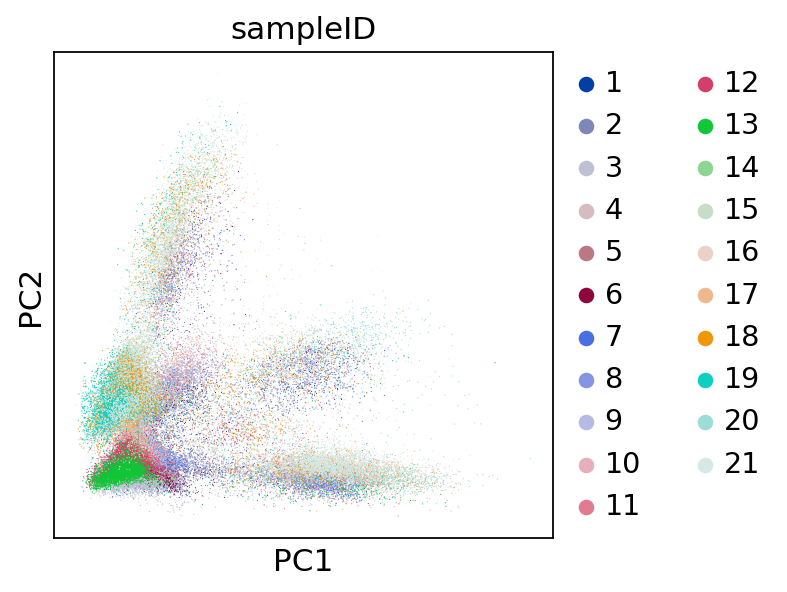

In [13]:
sc.pp.highly_variable_genes(alldata, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pp.highly_variable_genes(alldata,n_top_genes=3000,flavor='seurat')
sc.pl.highly_variable_genes(alldata,save="alldata_High_variable_genes.png")
alldata.raw = alldata

adata = alldata[:, alldata.var.highly_variable]
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])
#sc.pp.regress_out(adata, ['S_score','G2M_score']) #fen kai zuo , xiaoguo hao xiang bu yiyang 
sc.pp.scale(adata, max_value=10)

sc.tl.pca(adata, svd_solver='arpack')
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=50,save="adata_PCA_variance.png")
sc.pl.pca(adata,color=['sampleID'])


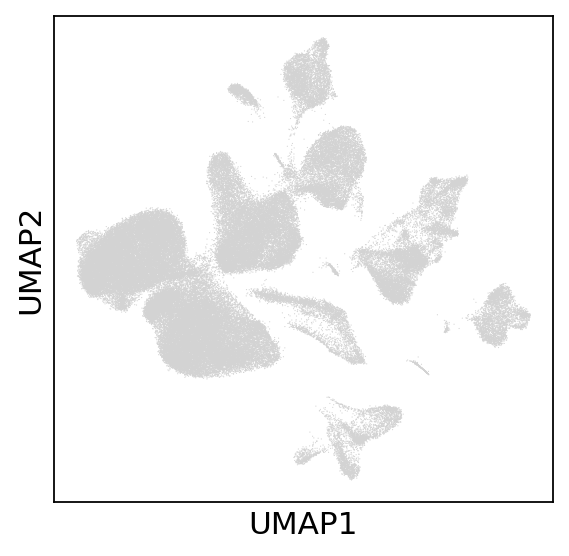

In [14]:
bbknn.bbknn(adata,batch_key='sampleID') 
sc.tl.umap(adata)
sc.pl.umap(adata)
sc.tl.leiden(adata)
sc.tl.louvain(adata)

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


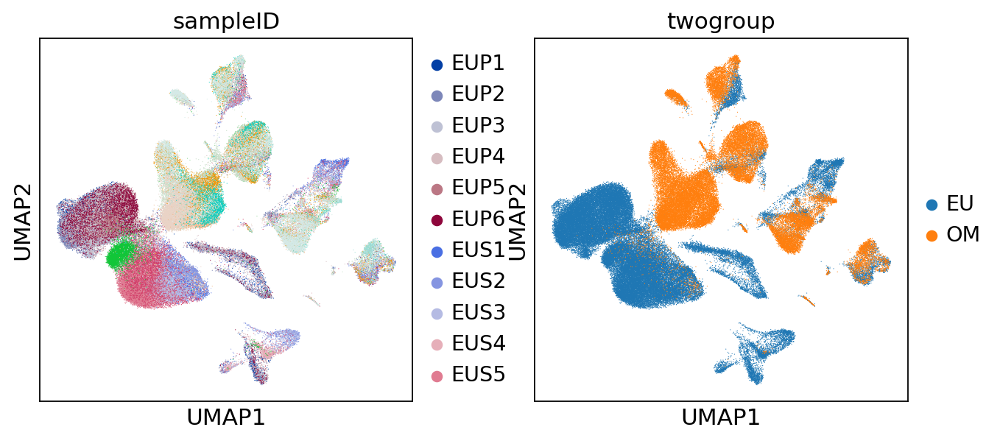

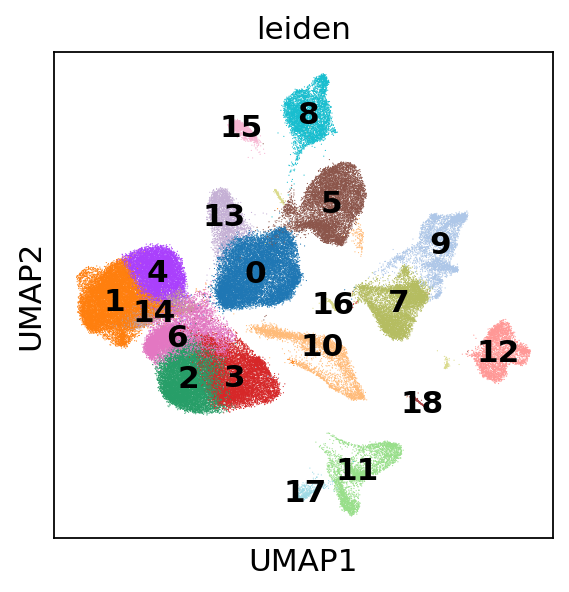

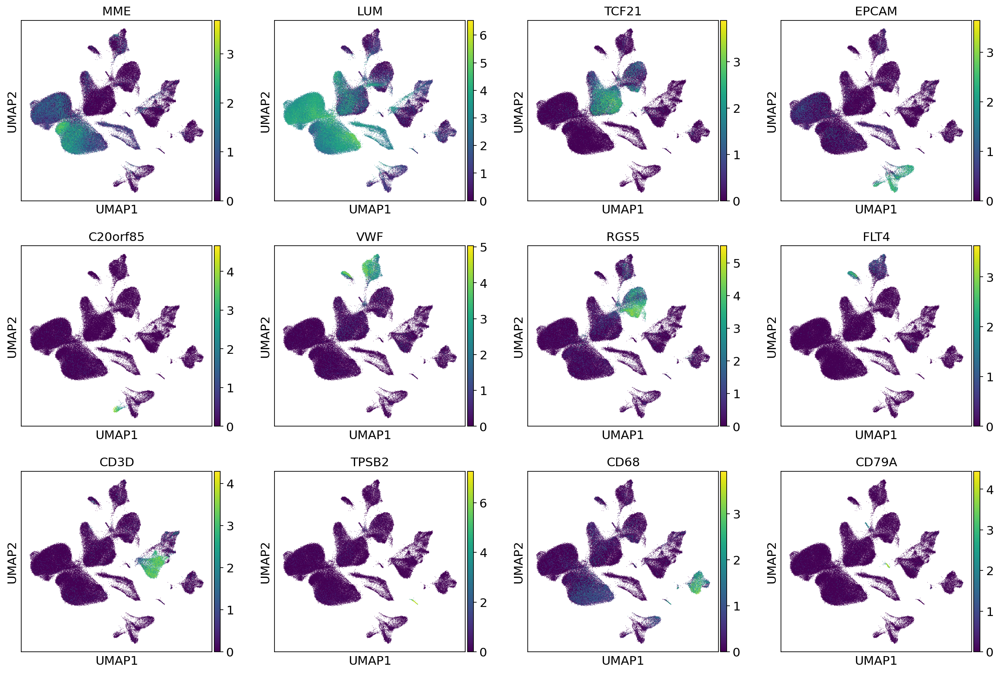

In [15]:
fourgroup=['EUP1','EUP2','EUP3','EUP4','EUP5','EUP6','EUS1','EUS2','EUS3','EUS4','EUS5','EUS6','EUS7','OMAP1','OMAP2','OMAS3','OMAS4','OMAS5','OMAS6','OMAP7','OMAS8']
adata.rename_categories('sampleID',fourgroup)
adata.obs['fourgroup']=adata.obs.sampleID.str.strip('0123456789')
adata.obs['twogroup']=adata.obs['fourgroup'].str[0:2]
sc.pl.umap(adata,color=['sampleID','twogroup'])
sc.pl.umap(adata,color=['leiden'],legend_loc="on data")
sc.pl.umap(adata,color=['MME','LUM','TCF21','EPCAM','C20orf85','VWF','RGS5','FLT4','CD3D','TPSB2','CD68','CD79A'])

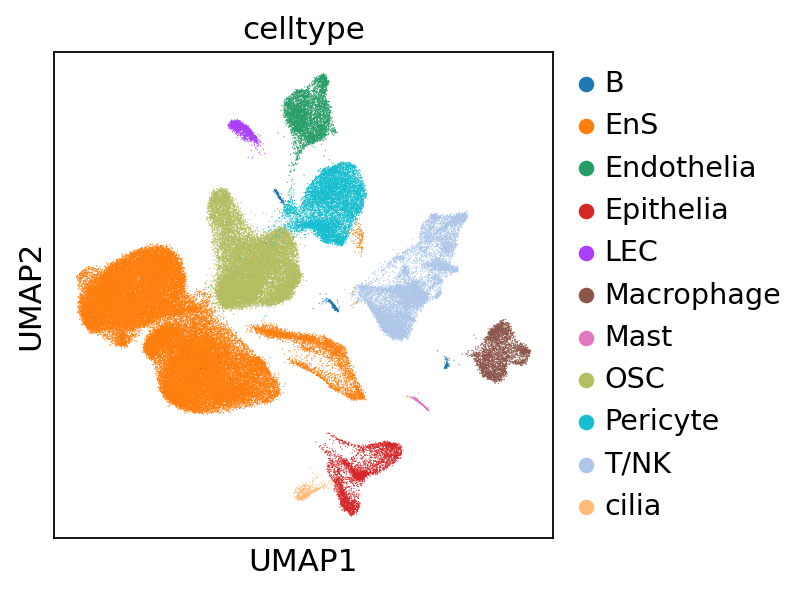

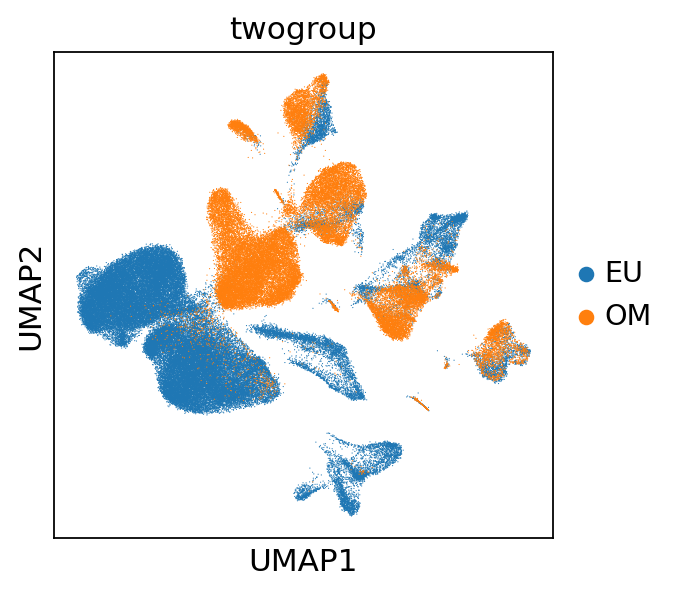

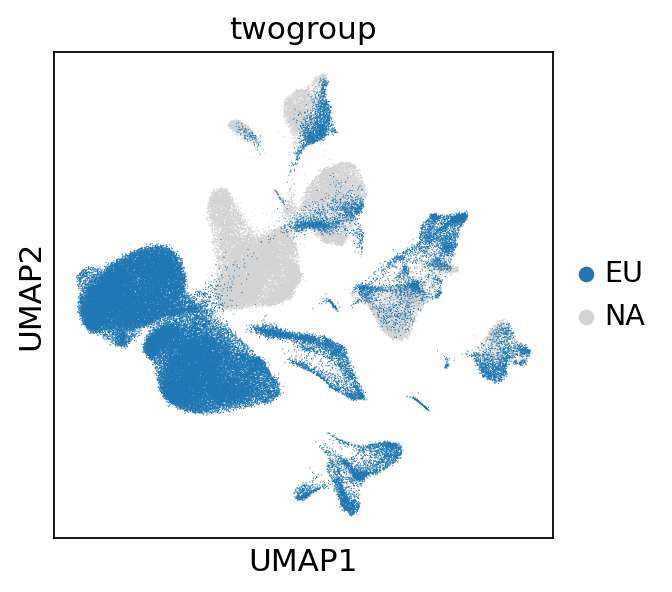

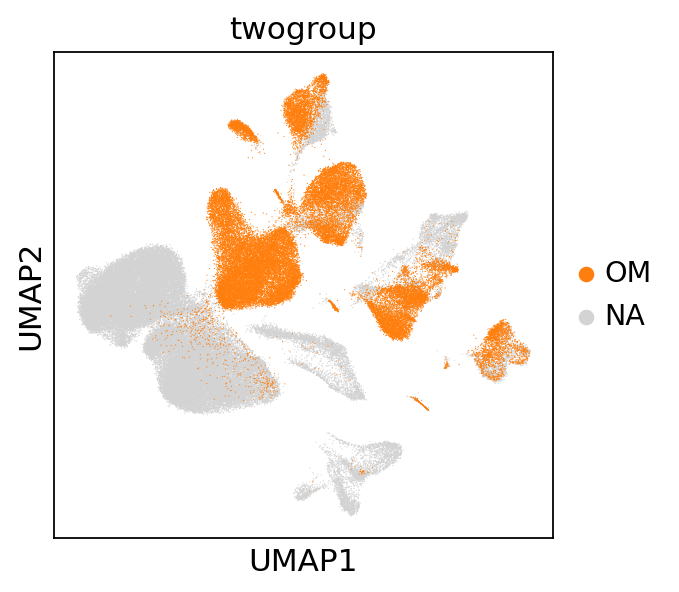

In [16]:
adata.obs['myname']=adata.obs['leiden']
#new_cluster_names = ['EnS0', 'EnS1','OSC2','EnS3','EnS4','Pericyte5','T/NK6','Endothelia7','T/NK8','Epithelia9','Macrophage10','OSC11','EnS12','LEC13','B14','Mast15']
new_cluster_names = ['OSC0', 'EnS1','EnS2','EnS3','EnS4','Pericyte5','EnS6','T/NK7','Endothelia8','T/NK9','EnS10','Epithelia11','Macrophage12','OSC13','EnS14','LEC15','B16','cilia17','Mast18']
adata.rename_categories('myname', new_cluster_names)
adata.obs['celltype']=adata.obs.myname.str.strip('0123456789')
sc.pl.umap(adata,color=['celltype'],save="alldata_celltype2024.pdf")
sc.pl.umap(adata,color=['twogroup'],save="alldata_twogroup2024.pdf")
for tissues in ['EU','OM']:
        sc.pl.umap(adata,color=['twogroup'],groups=tissues)


adata.write("adata_umap_leiden_BBKNN2024.h5ad")


/home/liusong/.local/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


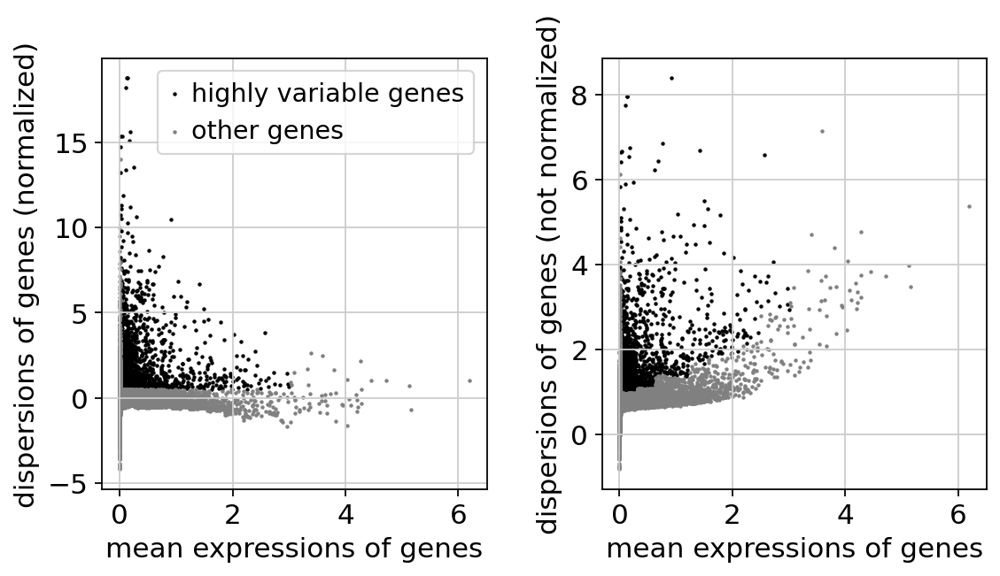

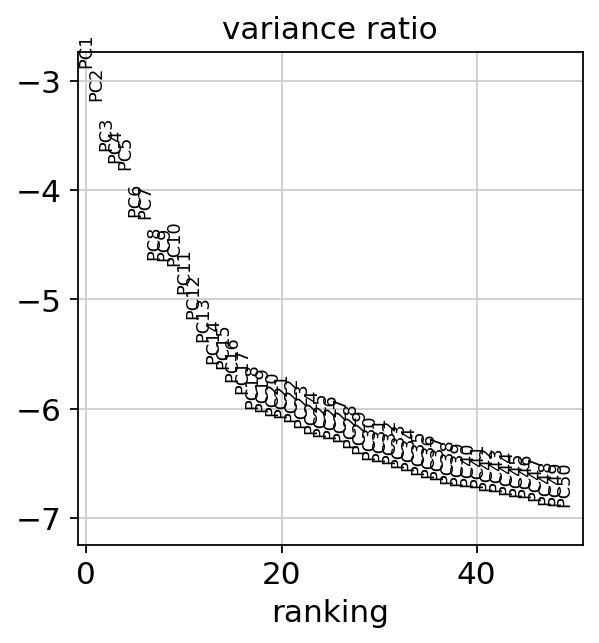

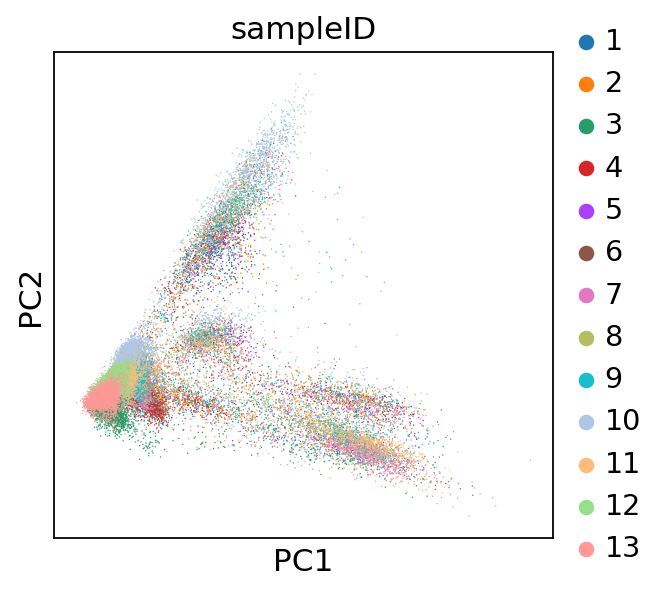

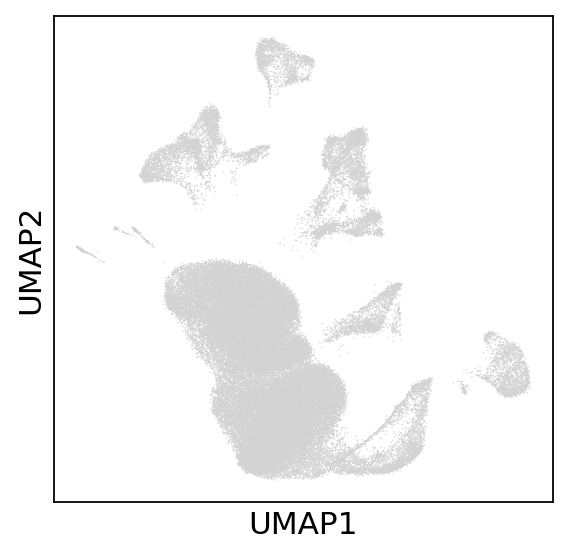

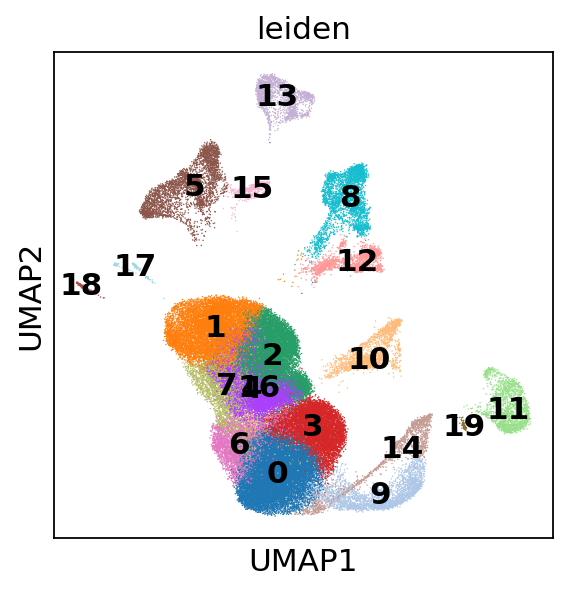

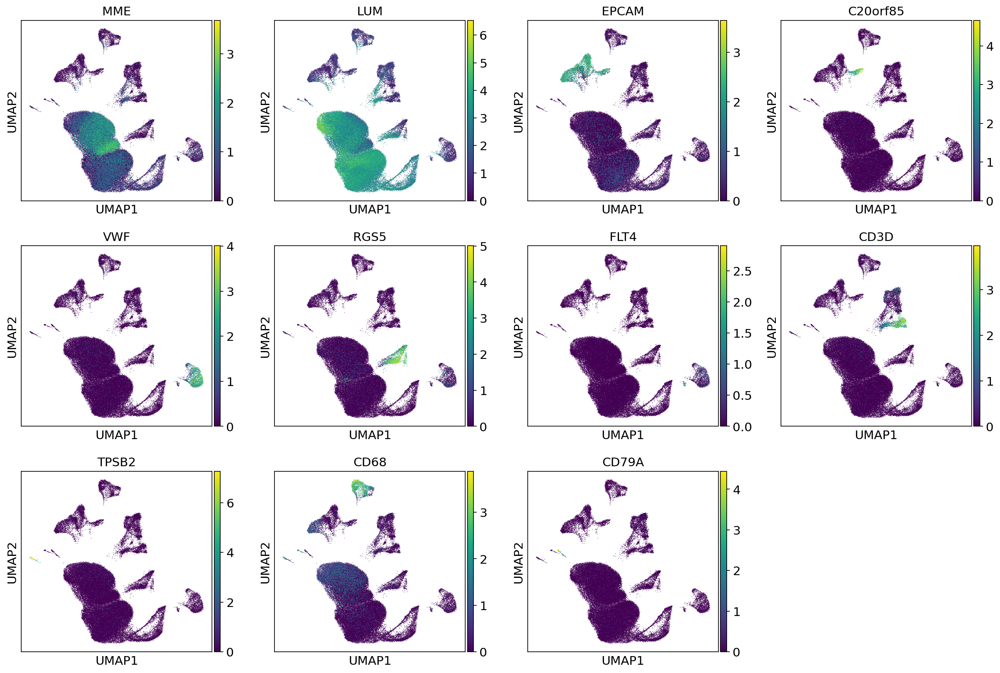

In [23]:
alldata=sc.read_h5ad("alldata_normalized2024.h5ad")
alldata.obs
EUdata=alldata[alldata.obs['sampleID'].isin(['1','2','3','4','5','6','7','8','9','10','11','12','13']),]
EUdata.uns['log1p']["base"] = None #due to the annoconda version not mathch

sc.pp.highly_variable_genes(EUdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(EUdata)
EUdata.raw = EUdata

EUdata = EUdata[:, EUdata.var.highly_variable]
sc.pp.regress_out(EUdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(EUdata, max_value=10)

sc.tl.pca(EUdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(EUdata, log=True,n_pcs=50,save="adata_PCA_variance.png")
sc.pl.pca(EUdata,color=['sampleID'])

bbknn.bbknn(EUdata,batch_key='sampleID') 
sc.tl.umap(EUdata)
sc.pl.umap(EUdata)
sc.tl.leiden(EUdata)
sc.tl.louvain(EUdata)

sc.pl.umap(EUdata,color=['leiden'],legend_loc="on data")
sc.pl.umap(EUdata,color=['MME','LUM','EPCAM','C20orf85','VWF','RGS5','FLT4','CD3D','TPSB2','CD68','CD79A'])



/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


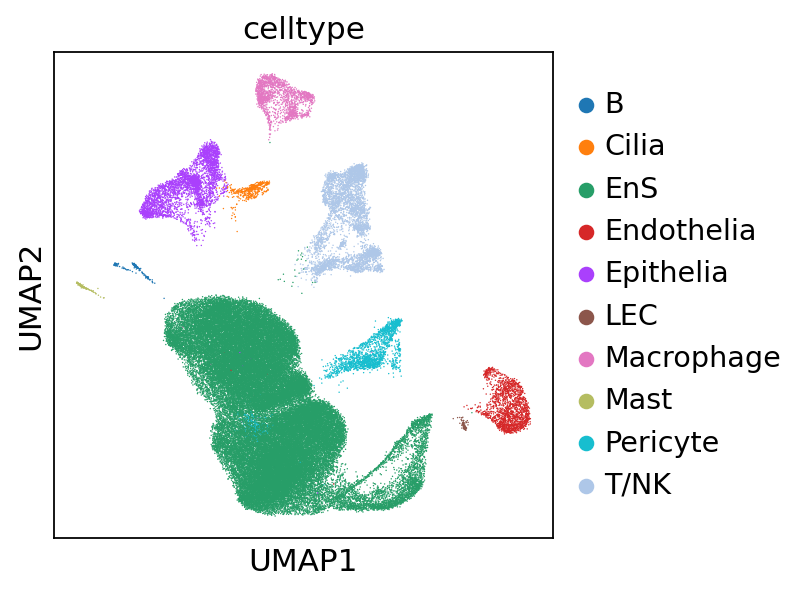

In [24]:
EUdata.obs['myname']=EUdata.obs['leiden']
EU_cluster_names = ['EnS0', 'EnS1','EnS2','EnS3','EnS4','Epithelia5','EnS6','EnS7','T/NK8','EnS9','Pericyte10','Endothelia11','T/NK12','Macrophage13','EnS14','Cilia15','EnS16','B17','Mast18','LEC19']
EUdata.rename_categories('myname', EU_cluster_names)
EUdata.obs['celltype']=EUdata.obs.myname.str.strip('0123456789')
sc.pl.umap(EUdata,color=['celltype'],save="EUdata_celltype2024.pdf")


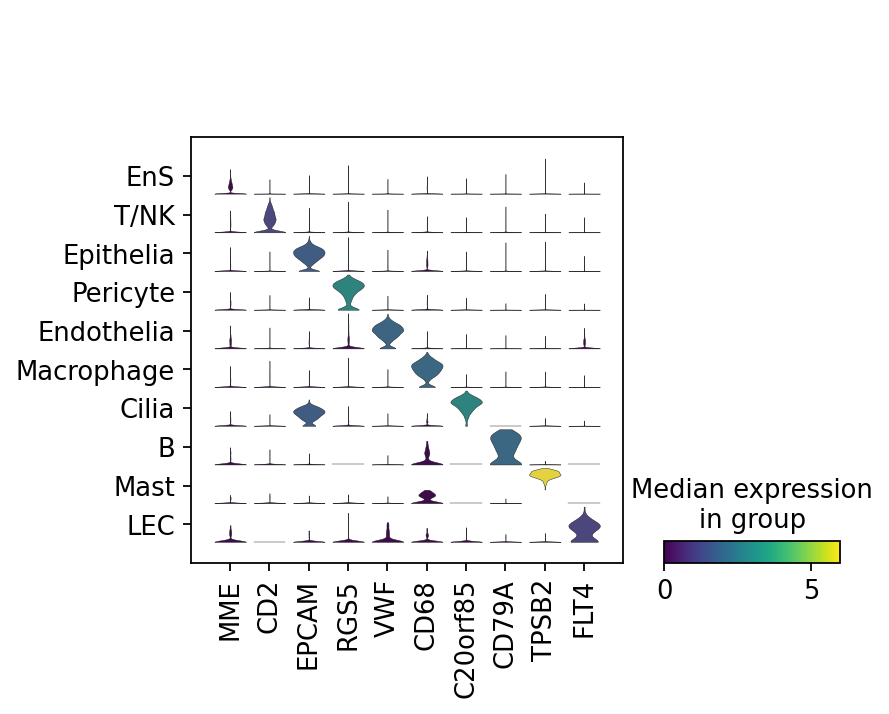

In [29]:
EU1=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='1',:].obs['celltype']),orient="index",columns=['EU1'])
EU2=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='2',:].obs['celltype']),orient="index",columns=['EU2'])
EU3=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='3',:].obs['celltype']),orient="index",columns=['EU3'])
EU4=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='4',:].obs['celltype']),orient="index",columns=['EU4'])
EU5=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='5',:].obs['celltype']),orient="index",columns=['EU5'])
EU6=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='6',:].obs['celltype']),orient="index",columns=['EU6'])
EU7=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='7',:].obs['celltype']),orient="index",columns=['EU7'])
EU8=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='8',:].obs['celltype']),orient="index",columns=['EU8'])
EU9=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='9',:].obs['celltype']),orient="index",columns=['EU9'])
EU10=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='10',:].obs['celltype']),orient="index",columns=['EU10'])
EU11=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='11',:].obs['celltype']),orient="index",columns=['EU11'])
EU12=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='12',:].obs['celltype']),orient="index",columns=['EU12'])
EU13=pd.DataFrame.from_dict(Counter(EUdata[EUdata.obs['sampleID']=='13',:].obs['celltype']),orient="index",columns=['EU13'])
dataframes=[EU1,EU2,EU3,EU4,EU5,EU6,EU7,EU8,EU9,EU10,EU11,EU12,EU13]
from functools import reduce
countdf= reduce (lambda left, right: pd.merge(left,right,how="outer",left_index=True,right_index=True),dataframes)
countdf.to_csv("EUcellcount.csv",index=True,header=True)
sc.pl.stacked_violin(EUdata,['MME','CD2','EPCAM','RGS5','VWF','CD68','C20orf85','CD79A','TPSB2','FLT4'],groupby="celltype",categories_order=['EnS','T/NK','Epithelia','Pericyte','Endothelia','Macrophage','Cilia','B','Mast','LEC'],cmap=None,save="EUdata_cellmarkes_stacked_violiln.pdf")

EUdata.write("EUdata_umap_leiden_BBKNN2024.h5ad")

/home/liusong/.local/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


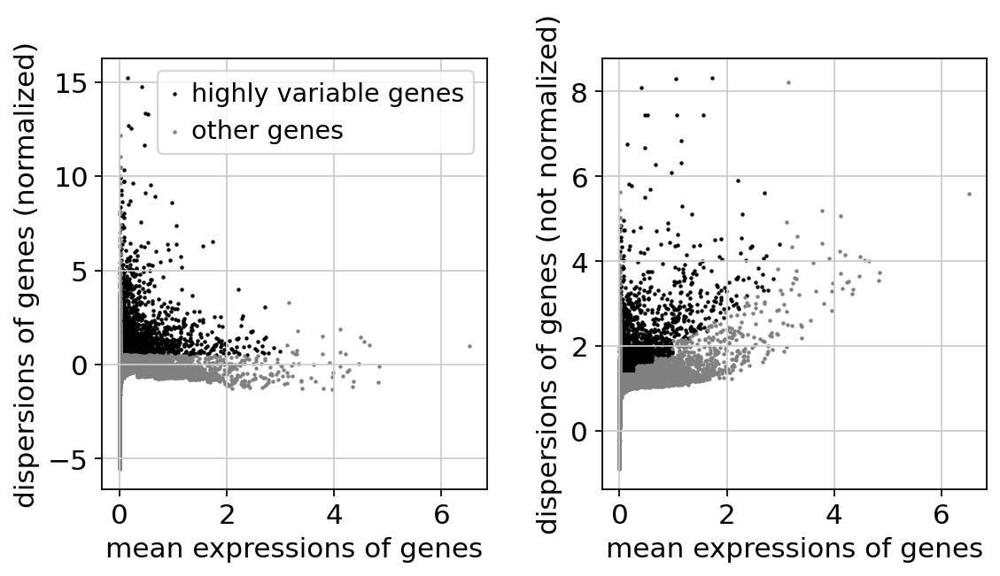

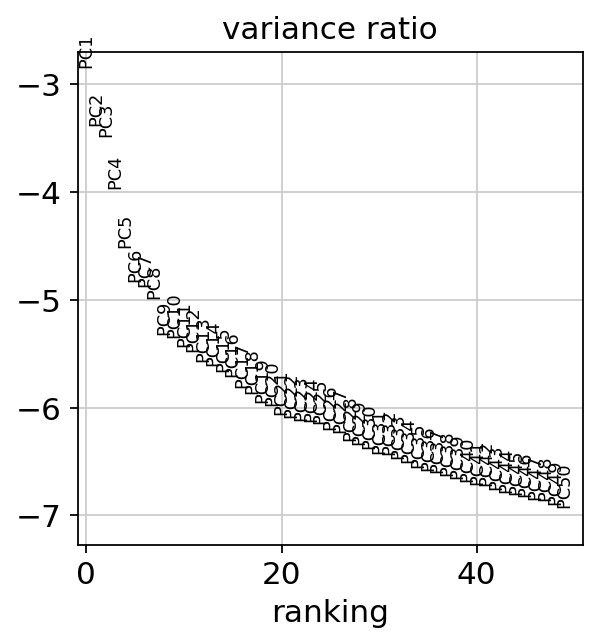

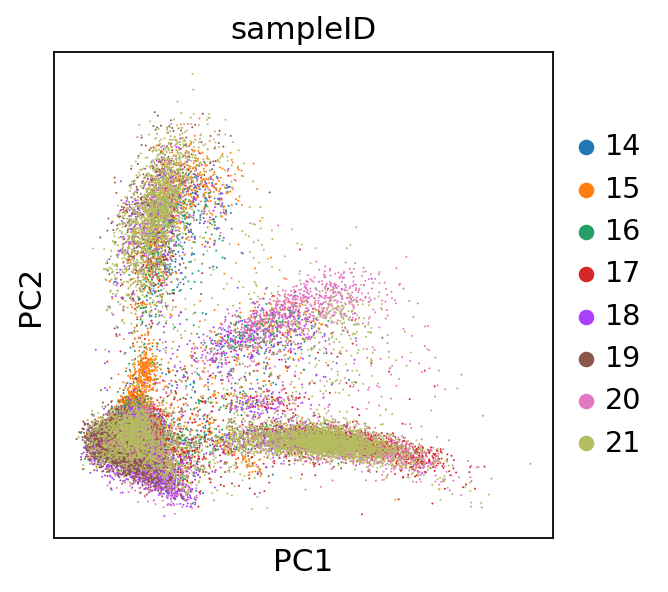

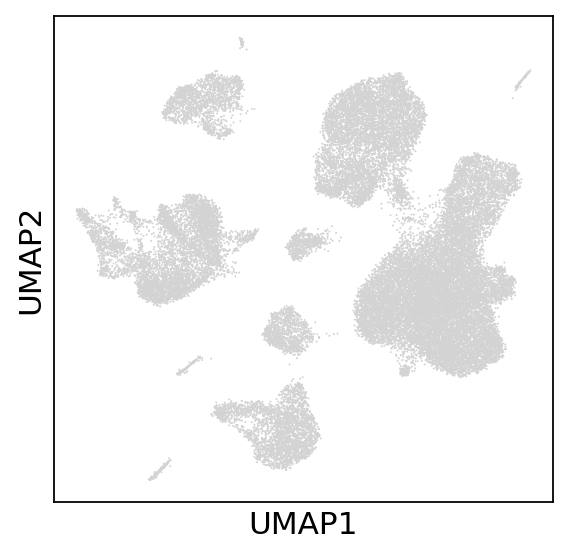

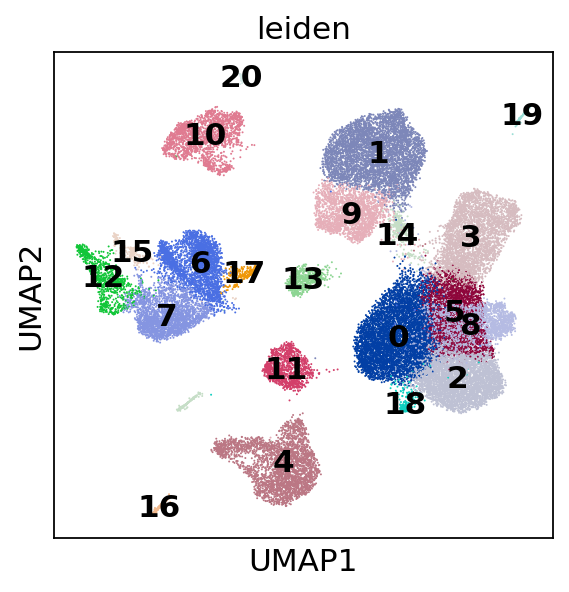

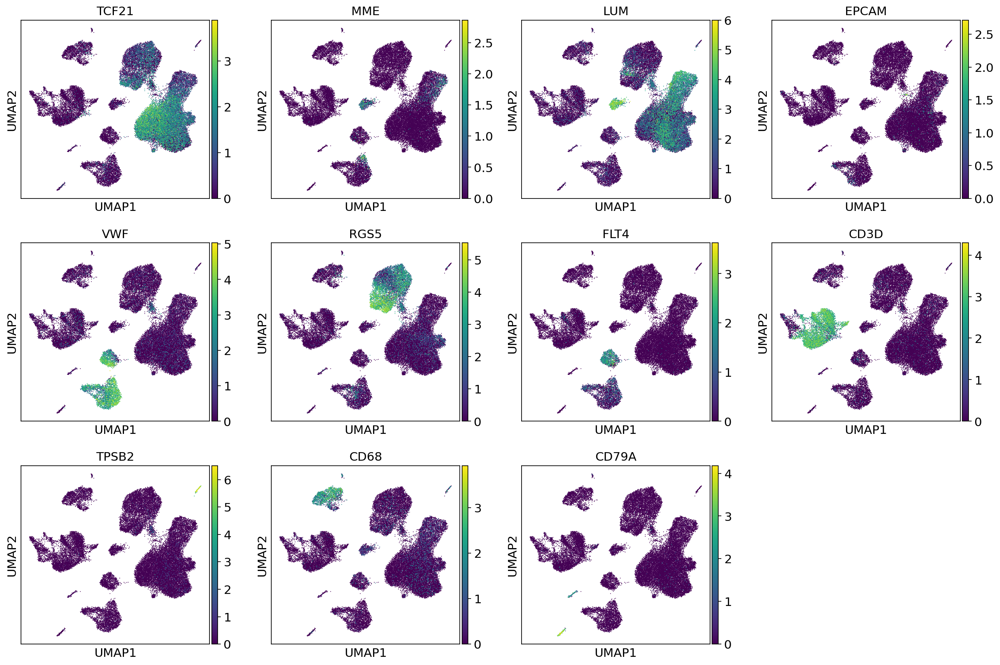

In [30]:
alldata=sc.read_h5ad("alldata_normalized2024.h5ad")
alldata.obs
OEMdata=alldata[alldata.obs['sampleID'].isin(['14','15','16','17','18','19','20','21']),]
OEMdata.uns['log1p']["base"] = None #due to the annoconda version not mathch

sc.pp.highly_variable_genes(OEMdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(OEMdata)
OEMdata.raw = OEMdata

OEMdata = OEMdata[:, OEMdata.var.highly_variable]
sc.pp.regress_out(OEMdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(OEMdata, max_value=10)

sc.tl.pca(OEMdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(OEMdata, log=True,n_pcs=50,save="adata_PCA_variance.png")
sc.pl.pca(OEMdata,color=['sampleID'])

bbknn.bbknn(OEMdata,batch_key='sampleID') 
sc.tl.umap(OEMdata)
sc.pl.umap(OEMdata)
sc.tl.leiden(OEMdata)
sc.tl.louvain(OEMdata)

sc.pl.umap(OEMdata,color=['leiden'],legend_loc="on data")
sc.pl.umap(OEMdata,color=['TCF21','MME','LUM','EPCAM','VWF','RGS5','FLT4','CD3D','TPSB2','CD68','CD79A'])

/home/liusong/.local/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


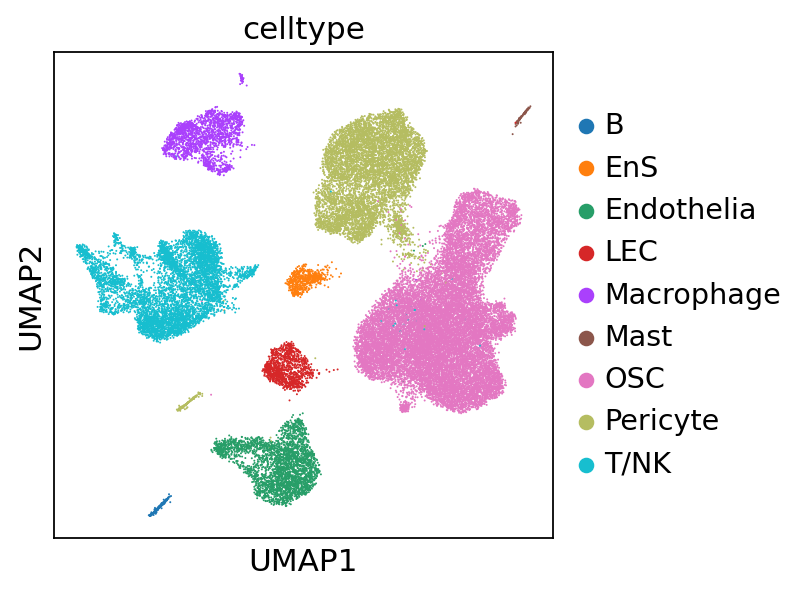

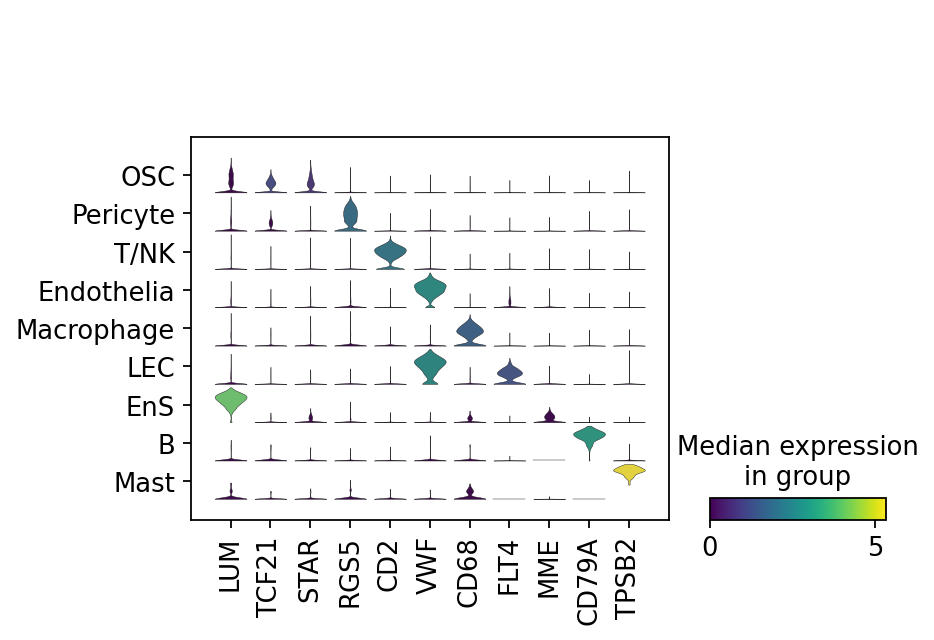

In [32]:
OEMdata.obs['myname']=OEMdata.obs['leiden']
OEM_cluster_names = ['OSC0', 'Pericyte1','OSC2','OSC3','Endothelia4','OSC5','T/NK6','T/NK7','OSC8','Pericyte9','Macrophage10','LEC11','T/NK12','EnS13','Pericyte14','T/NK15','B16','T/NK17','OSC18','Mast19','Macrophage20']
OEMdata.rename_categories('myname', OEM_cluster_names)
OEMdata.obs['celltype']=OEMdata.obs.myname.str.strip('0123456789')
sc.pl.umap(OEMdata,color=['celltype'],save="OEMdata_celltype2024.pdf")
sc.pl.stacked_violin(OEMdata,['LUM','TCF21','STAR','RGS5','CD2','VWF','CD68','FLT4','MME','CD79A','TPSB2'],groupby="celltype",categories_order=['OSC','Pericyte','T/NK','Endothelia','Macrophage','LEC','EnS','B','Mast'],cmap=None,save="OEMdata_cellmarkes_stacked_violiln.pdf")


In [34]:
OEM1=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='14',:].obs['celltype']),orient="index",columns=['OEM1'])
OEM2=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='15',:].obs['celltype']),orient="index",columns=['OEM2'])
OEM3=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='16',:].obs['celltype']),orient="index",columns=['OEM3'])
OEM4=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='17',:].obs['celltype']),orient="index",columns=['OEM4'])
OEM5=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='18',:].obs['celltype']),orient="index",columns=['OEM5'])
OEM6=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='19',:].obs['celltype']),orient="index",columns=['OEM6'])
OEM7=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='20',:].obs['celltype']),orient="index",columns=['OEM7'])
OEM8=pd.DataFrame.from_dict(Counter(OEMdata[OEMdata.obs['sampleID']=='21',:].obs['celltype']),orient="index",columns=['OEM8'])

dataframes=[OEM1,OEM2,OEM3,OEM4,OEM5,OEM6,OEM7,OEM8]
#from functools import reduce
countdf= reduce (lambda left, right: pd.merge(left,right,how="outer",left_index=True,right_index=True),dataframes)
countdf.to_csv("OEMcellcount.csv",index=True,header=True)
OEMdata.write("OEMdata_umap_leiden_BBKNN2024.h5ad")